*数据集*

In [1]:
!pip install torchsummary

In [2]:
from torchsummary import summary

In [3]:
import glob
import random
import os
from torch.utils.data import Dataset,DataLoader
from PIL import Image
import torchvision.transforms as transforms
from matplotlib import pylab as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch

In [4]:
def to_rgb(image):
    rgb_image = Image.new("RGB", image.size)
    rgb_image.paste(image)
    return rgb_image

In [5]:
device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [6]:
class ImageDataset(Dataset):
    def __init__(self, root, transform=None,unaligned=False,mode="train"):
        self.unaligned = unaligned
        self.transform = transform
        self.files_A = sorted(glob.glob(os.path.join(root, "%sA" % mode) + "/*.*"))
        self.files_B = sorted(glob.glob(os.path.join(root, "%sB" % mode) + "/*.*"))

    def __getitem__(self, index):
        image_A = Image.open(self.files_A[index % len(self.files_A)])

        if self.unaligned:
            image_B = Image.open(self.files_B[random.randint(0, len(self.files_B) - 1)])
        else:
            image_B = Image.open(self.files_B[index % len(self.files_B)])

        # Convert grayscale images to rgb
        if image_A.mode != "RGB":
            image_A = to_rgb(image_A)
        if image_B.mode != "RGB":
            image_B = to_rgb(image_B)

        item_A = self.transform(image_A)
        item_B = self.transform(image_B)
        return {"A": item_A, "B": item_B}

    def __len__(self):
        return max(len(self.files_A), len(self.files_B))

In [7]:
class imgdataset(Dataset):
    def __init__(self,root,transform=None,mode='test'):
        self.transform=transform
        self.files_A=sorted(glob.glob(os.path.join(root,"%sA" % mode)+"/*.*"))
        self.files_B=sorted(glob.glob(os.path.join(root,"%sB" % mode)+"/*.*"))
    def __getitem__(self,index):
        img_A=Image.open(self.files_A[index%len(self.files_A)])
        img_B=Image.open(self.files_B[index%len(self.files_B)])
        if img_A.mode!='RGB':
            img_A=to_rgb(img_A)
        if img_B.mode!='RGB':
            img_B=to_rgb(img_B)
        item_A=self.transform(img_A)
        item_B=self.transform(img_B)
        
        return {"A":item_A,"B":item_B}
    def __len__(self):
        return max(len(self.files_A),len(self.files_B))

In [8]:
# Image transformations
transform =transforms.Compose([
    transforms.Resize(int(256* 1.12), Image.BICUBIC),
    transforms.RandomCrop((256,256)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])
train_images=ImageDataset('../input/cgan-data/horse2zebra/horse2zebra', transform=transform, unaligned=True)
test_images=imgdataset('../input/cgan-data/horse2zebra/horse2zebra', transform=transform, mode="test")
# Training data loader
dataloader = DataLoader(
    train_images,
    batch_size=1,
    shuffle=True,
    num_workers=8,
)
# Test data loader
val_dataloader = DataLoader(
    test_images,
    batch_size=5,
    shuffle=True,
    num_workers=1,
)

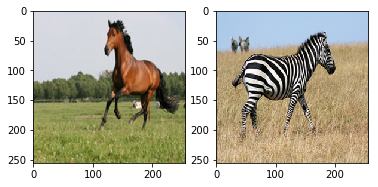

In [9]:
A_data=test_images.__getitem__(11)['A'].unsqueeze(0)#(1,3,256,256)
B_data=test_images.__getitem__(27)['B'].unsqueeze(0)
plt.subplot(1,2,1)
plt.imshow(np.transpose((A_data[0]+1)/2,(1,2,0)))
plt.subplot(1,2,2)
plt.imshow(np.transpose((B_data[0]+1)/2,(1,2,0)))

In [10]:
# a=next(iter(dataloader))
# plt.figure(figsize=(10,5))
# plt.subplot(1,2,1)
# plt.imshow(np.transpose((a['A'][0]+1)/2,(1,2,0)))
# plt.subplot(1,2,2)
# plt.imshow(np.transpose((a['B'][0]+1)/2,(1,2,0)))

*模型定义*

In [11]:
class resnetblock(nn.Module):
    def __init__(self,ch_in):
        super(resnetblock,self).__init__()
        self.block=nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(ch_in,ch_in,kernel_size=3,stride=1),
            nn.InstanceNorm2d(ch_in),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(ch_in,ch_in,kernel_size=3,stride=1),
            nn.InstanceNorm2d(ch_in)
        )
    def forward(self,x):
        return x+self.block(x)

In [12]:
class resGenerator(nn.Module):
    def __init__(self):
        super(resGenerator,self).__init__()
        #init conv_block
        inf=64
        model=[
            nn.ReflectionPad2d(3),
            nn.Conv2d(3,inf,kernel_size=7,stride=1,padding=0),
            nn.InstanceNorm2d(inf),
            nn.ReLU(inplace=True)
        ]
        #downsampling
        outf=inf
        for i in range(2):
            outf*=2
            model+=[
                nn.Conv2d(inf,outf,kernel_size=3,stride=2,padding=1),
                nn.InstanceNorm2d(outf),
                nn.ReLU(inplace=True)
            ]
            inf=outf
        #resnetblock
        for i in range(9):
            model+=[resnetblock(inf)]
        #upsampling
        for i in range(2):
            outf//=2
            model+=[
                nn.ConvTranspose2d(inf,outf,kernel_size=3,stride=2,padding=1,output_padding=1),
                nn.InstanceNorm2d(outf),
                nn.ReLU(inplace=True)
            ]
            inf=outf
        #output layer
        model+=[nn.ReflectionPad2d(3),nn.Conv2d(inf,3,kernel_size=7),nn.Tanh()]
        
        self.model=nn.Sequential(*model)
        
        for m in self.modules():
            if isinstance(m,nn.Conv2d):
                nn.init.normal_(m.weight.data,0.0,0.02)
                nn.init.constant_(m.bias.data,0.0)
            elif isinstance(m,nn.BatchNorm2d):
                nn.init.normal_(m.weight.data, 1.0, 0.02)
                nn.init.constant_(m.bias.data, 0.0)
                
    def forward(self,x):
        return self.model(x)


In [13]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator,self).__init__()       
        inf=64
        model=[nn.Conv2d(3,inf,kernel_size=4,stride=2,padding=1),nn.LeakyReLU(0.2)]
        outf=inf
        for i in range(3):
            outf*=2
            model+=[
                nn.Conv2d(inf,outf,kernel_size=4,stride=2,padding=1),
                nn.InstanceNorm2d(outf),
                nn.LeakyReLU(0.2)
            ]
            inf=outf
        model+=[nn.ZeroPad2d((1,0,1,0)),nn.Conv2d(inf,1,kernel_size=4,stride=1,padding=1)]
        self.model=nn.Sequential(*model)
        
        for m in self.modules():
            if isinstance(m,nn.Conv2d):
                nn.init.normal_(m.weight.data,0.0,0.02)
                nn.init.constant_(m.bias.data,0.0)
            elif isinstance(m,nn.BatchNorm2d):
                nn.init.normal_(m.weight.data,1.0,0.02)
                nn.init.constant_(m.bias.data,0.0)
            
    def forward(self,x):
        return self.model(x)

In [14]:
# Initialize generator and discriminator
G_AB = resGenerator().to(device)
G_BA = resGenerator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)
# summary(D_A,(3,256,256))

*参数设置*

In [15]:
import time
import itertools
import datetime
import sys

In [16]:
class ImagePool():
    def __init__(self,pool_size=50):
        self.pool_size=pool_size
        if self.pool_size>0:  # create an empty pool
            self.num_imgs=0
            self.images=[]
    def query(self,images):
        if self.pool_size==0:
            return images
        return_images=[]
        for image in images:
            image=torch.unsqueeze(image.data,0)
            if self.num_imgs<self.pool_size:
                self.num_imgs+=1
                self.images.append(image)
                return_images.append(image)
            else:
                p=random.uniform(0,1)
                if p>0.5:#use before
                    random_id=random.randint(0,self.pool_size-1)
                    tmp=self.images[random_id].clone()
                    self.images[random_id]=image
                    return_images.append(tmp)
                else:
                    return_images.append(image)
        return_images=torch.cat(return_images,0)
        return return_images

In [17]:
class LambdaLR:
    def __init__(self, n_epochs=50,offset=0,decay_start_epoch=40):
        assert (n_epochs - decay_start_epoch) > 0, "Decay must start before the training session ends!"
        self.n_epochs = n_epochs
        self.offset = offset
        self.decay_start_epoch = decay_start_epoch

    def step(self, epoch):
        return 1.0 - max(0, epoch + self.offset - self.decay_start_epoch) / (self.n_epochs - self.decay_start_epoch)

In [18]:
# Optimizers
optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=0.0002, betas=(0.5, 0.999)
)
optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Learning rate update schedulers
lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(
    optimizer_G, lr_lambda=LambdaLR(n_epochs=50,offset=0,decay_start_epoch=40).step
)
lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_A, lr_lambda=LambdaLR(n_epochs=50,offset=0,decay_start_epoch=40).step
)
lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_B, lr_lambda=LambdaLR(n_epochs=50,offset=0,decay_start_epoch=40).step
)

#loss
MSE_Loss=nn.MSELoss()
L1_Loss=nn.L1Loss()

*训练*

In [19]:
fake_A_pool = ImagePool()
fake_B_pool = ImagePool()

In [20]:
def plot_train_result(real_img,gen_img,recon_img,epoch,save=True):
    fig,axs=plt.subplots(2,3,figsize=(10,10))
    imgs=[real_img[0].cpu(),gen_img[0].cpu(),recon_img[0].cpu(),
          real_img[1].cpu(),gen_img[1].cpu(),recon_img[1].cpu()]
    
    for ax,img in zip(axs.flatten(),imgs):#2*3-->
        ax.axis('off')
        img=img.squeeze()
        img=np.transpose((img*0.5+0.5),(1,2,0))
        ax.imshow(img)
    title='Epoch {}'.format(epoch+1)
    fig.text(0.5,0.04,title,ha='center')
    if save:
        plt.savefig('./%d.png'%(epoch+1))
    plt.show()

In [21]:
def sample_images(batches_done):
    G_AB.eval()
    G_BA.eval()
    real_A=A_data.to(device)
    fake_B=G_AB(real_A).detach()
    recon_A=G_BA(fake_B).detach()
    
    real_B=B_data.to(device)
    fake_A=G_BA(real_B).detach()
    recon_B=G_AB(fake_A).detach()
    
    plot_train_result([real_A,real_B],[fake_B,fake_A],[recon_A,recon_B],
                           epoch,save=True)

[Epoch 0/50] [Batch 0/1334] [D loss: 2.464570] [G loss: 12.208100, adv: 2.960992, cycle: 6.176319, identity: 3.070789] ETA: 1 day, 2:01:42.429938

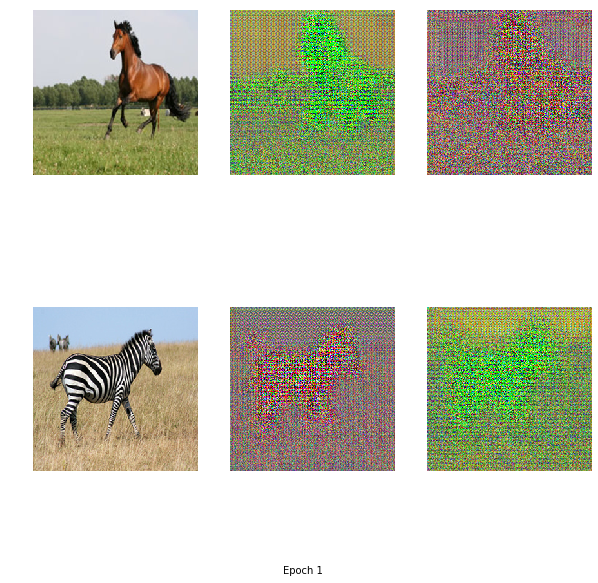

[Epoch 0/50] [Batch 100/1334] [D loss: 0.355236] [G loss: 4.442875, adv: 0.438541, cycle: 2.746799, identity: 1.257535] ETA: 7:21:48.435631

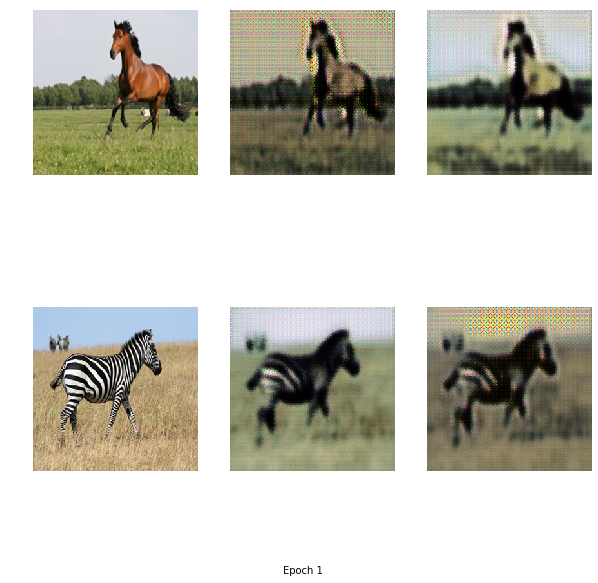

[Epoch 0/50] [Batch 200/1334] [D loss: 0.302597] [G loss: 4.410792, adv: 0.461303, cycle: 2.735016, identity: 1.214474] ETA: 7:13:40.321846

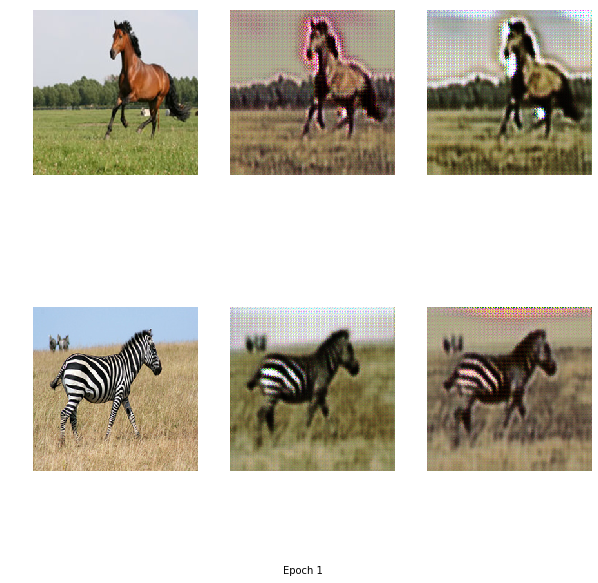

[Epoch 0/50] [Batch 300/1334] [D loss: 0.271853] [G loss: 6.307451, adv: 0.175168, cycle: 4.193317, identity: 1.938966] ETA: 7:12:02.064781

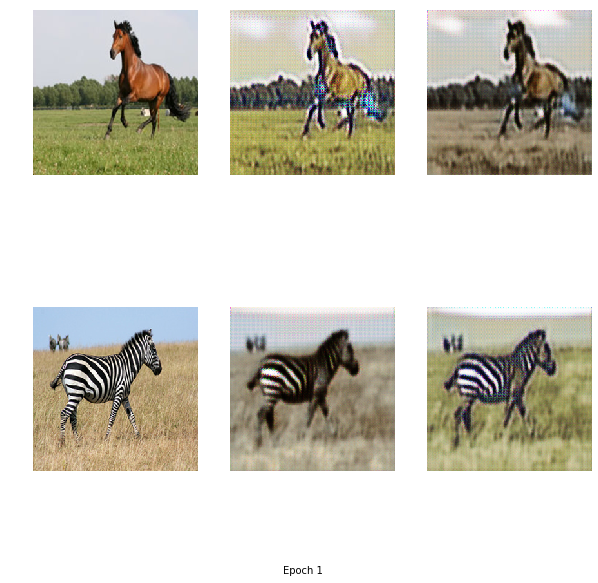

[Epoch 0/50] [Batch 400/1334] [D loss: 0.221698] [G loss: 6.242209, adv: 0.479825, cycle: 4.108020, identity: 1.654365] ETA: 7:14:20.128856

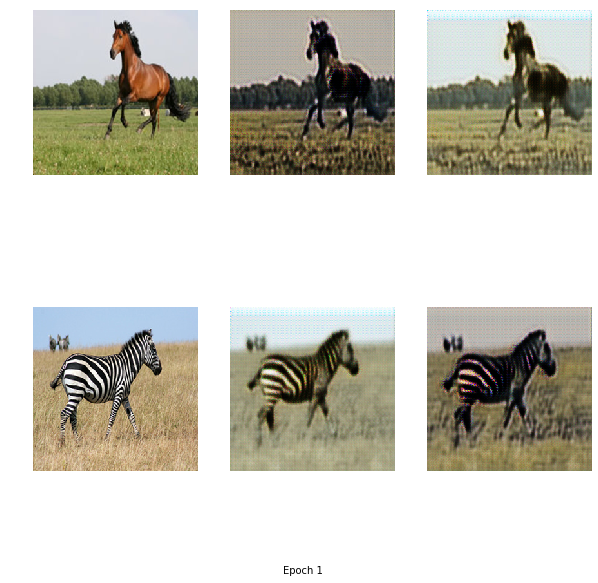

[Epoch 0/50] [Batch 500/1334] [D loss: 0.312919] [G loss: 4.334740, adv: 0.518595, cycle: 2.631039, identity: 1.185106] ETA: 7:09:58.546124

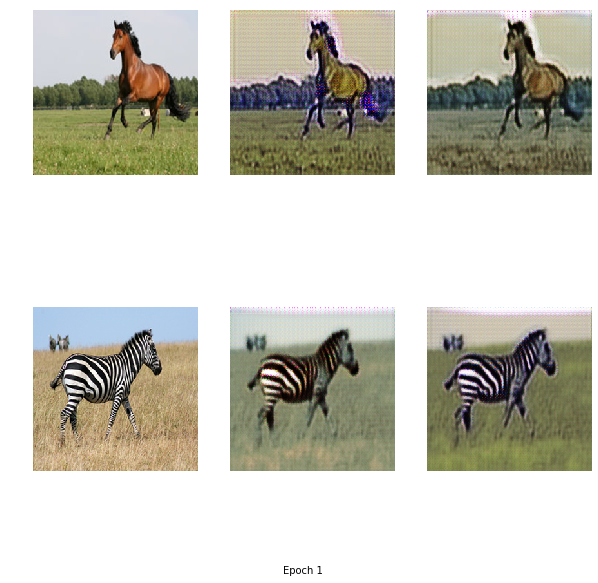

[Epoch 0/50] [Batch 600/1334] [D loss: 0.295920] [G loss: 3.400376, adv: 0.401285, cycle: 2.095253, identity: 0.903837] ETA: 7:09:07.755909

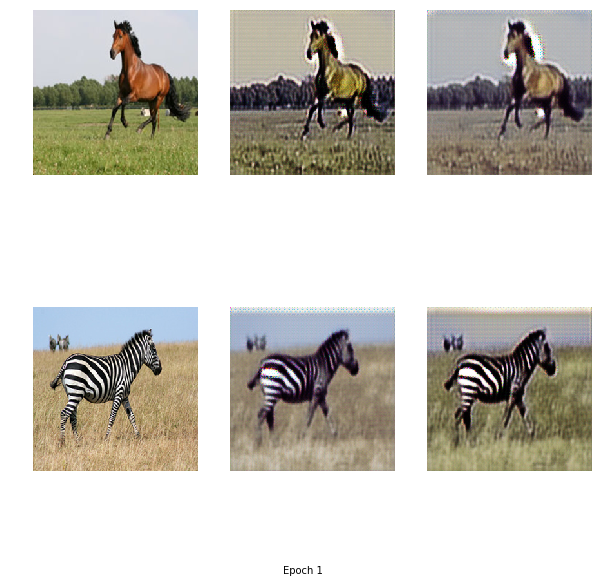

[Epoch 0/50] [Batch 700/1334] [D loss: 0.304829] [G loss: 3.565718, adv: 0.454369, cycle: 2.170193, identity: 0.941156] ETA: 7:09:24.019489

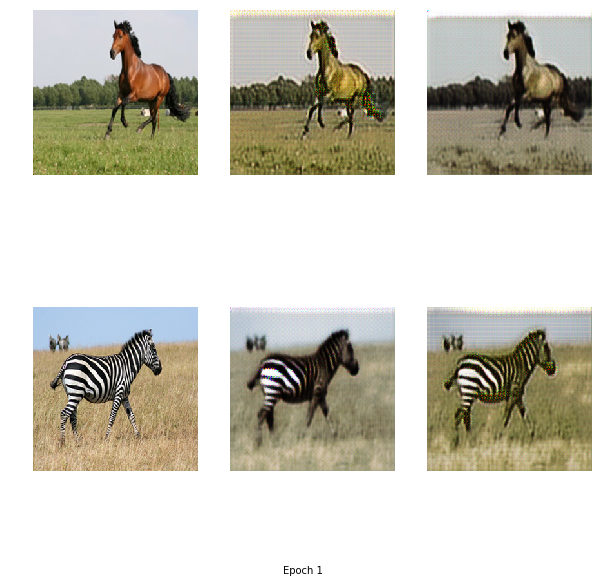

[Epoch 0/50] [Batch 800/1334] [D loss: 0.296984] [G loss: 3.490294, adv: 0.330640, cycle: 2.187104, identity: 0.972551] ETA: 7:07:54.909639

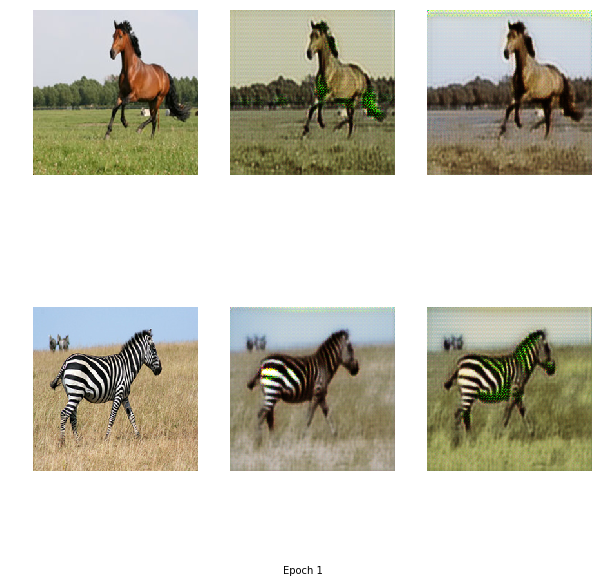

[Epoch 0/50] [Batch 900/1334] [D loss: 0.198332] [G loss: 3.802469, adv: 0.417653, cycle: 2.340833, identity: 1.043983] ETA: 7:07:38.822250

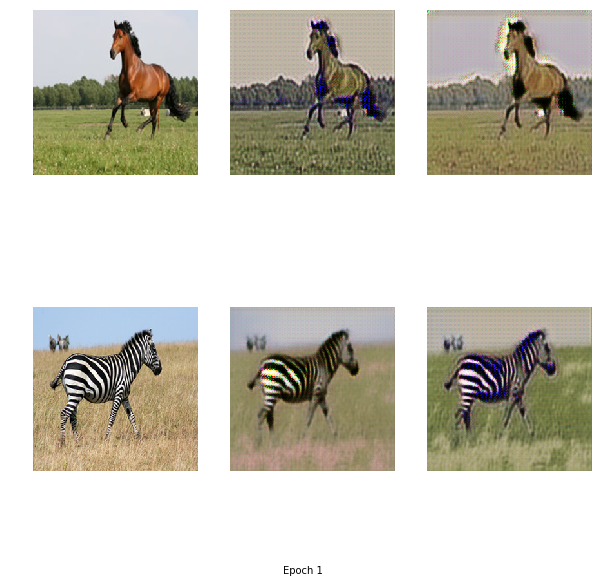

[Epoch 0/50] [Batch 1000/1334] [D loss: 0.166243] [G loss: 3.723605, adv: 0.364810, cycle: 2.241017, identity: 1.117777] ETA: 7:08:49.068518

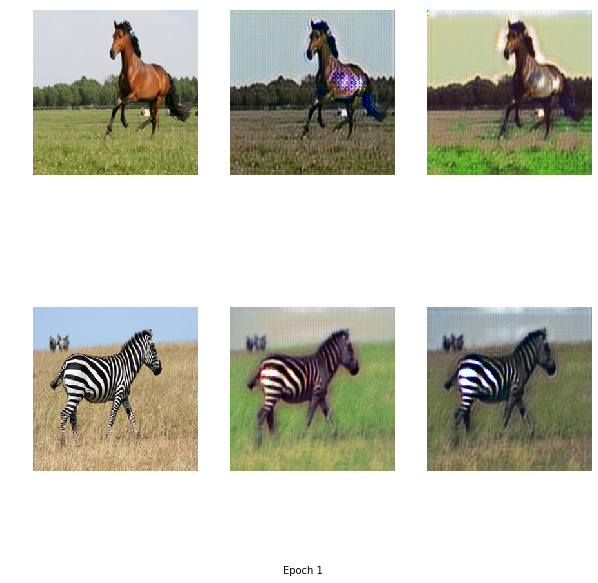

[Epoch 0/50] [Batch 1100/1334] [D loss: 0.241953] [G loss: 4.031328, adv: 0.378545, cycle: 2.544822, identity: 1.107960] ETA: 7:06:19.799652

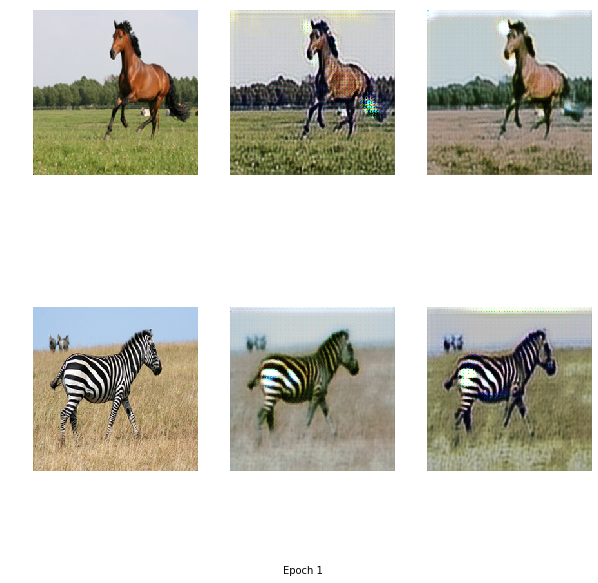

[Epoch 0/50] [Batch 1200/1334] [D loss: 0.154979] [G loss: 4.004055, adv: 0.372132, cycle: 2.442301, identity: 1.189621] ETA: 7:07:04.931693

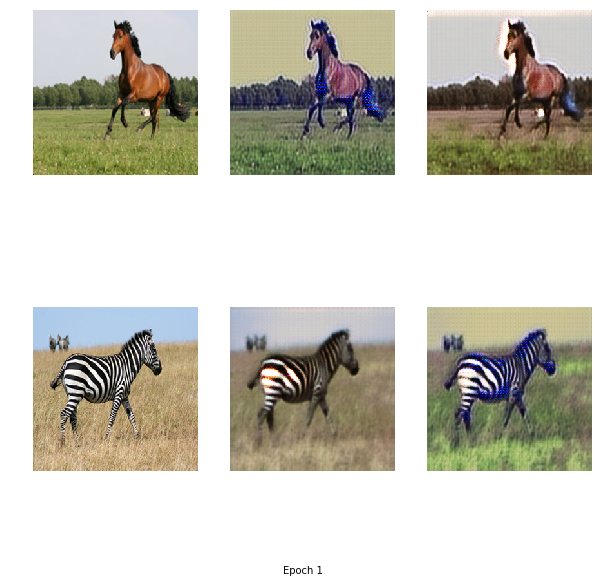

[Epoch 0/50] [Batch 1300/1334] [D loss: 0.291299] [G loss: 2.871616, adv: 0.392306, cycle: 1.673421, identity: 0.805889] ETA: 7:04:53.673134

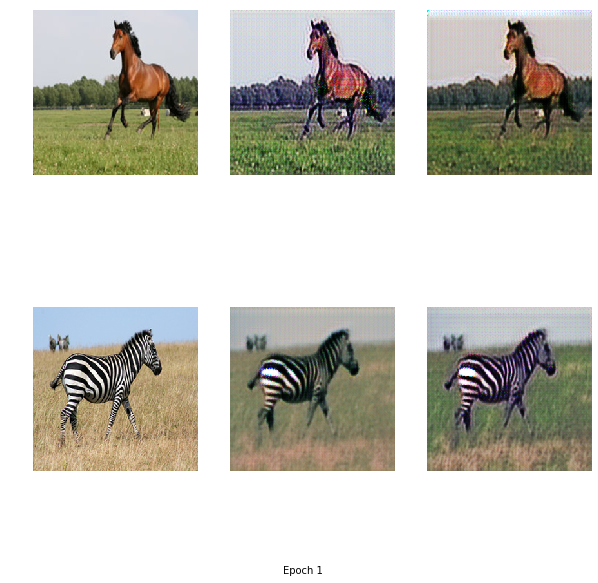

[Epoch 0/50] [Batch 1333/1334] [D loss: 0.264244] [G loss: 4.097891, adv: 0.511815, cycle: 2.409706, identity: 1.176370] ETA: 7:04:28.372757Time for one epoch is 530.2093663215637 sec
[Epoch 1/50] [Batch 66/1334] [D loss: 0.361931] [G loss: 2.837900, adv: 0.614880, cycle: 1.504939, identity: 0.718081] ETA: 7:04:25.356565

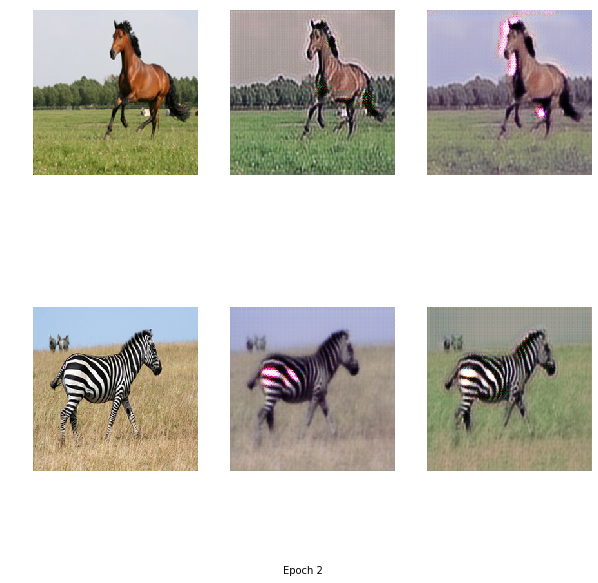

[Epoch 1/50] [Batch 166/1334] [D loss: 0.219825] [G loss: 3.238708, adv: 0.511471, cycle: 1.921331, identity: 0.805905] ETA: 7:04:48.227749

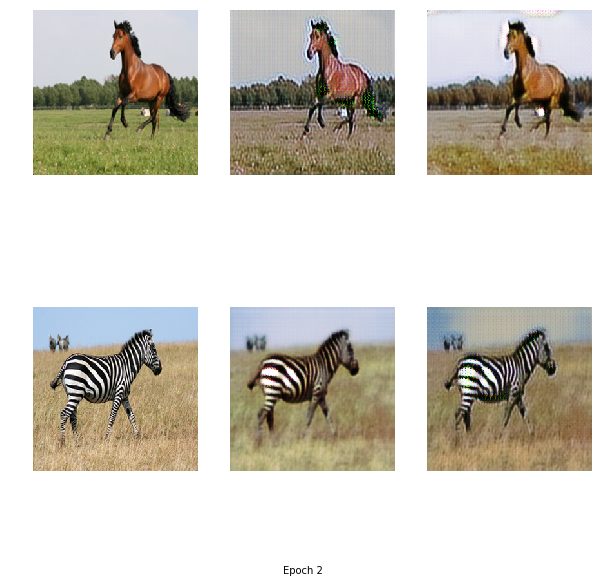

[Epoch 1/50] [Batch 266/1334] [D loss: 0.247061] [G loss: 3.841451, adv: 0.368208, cycle: 2.543987, identity: 0.929256] ETA: 7:03:30.224104

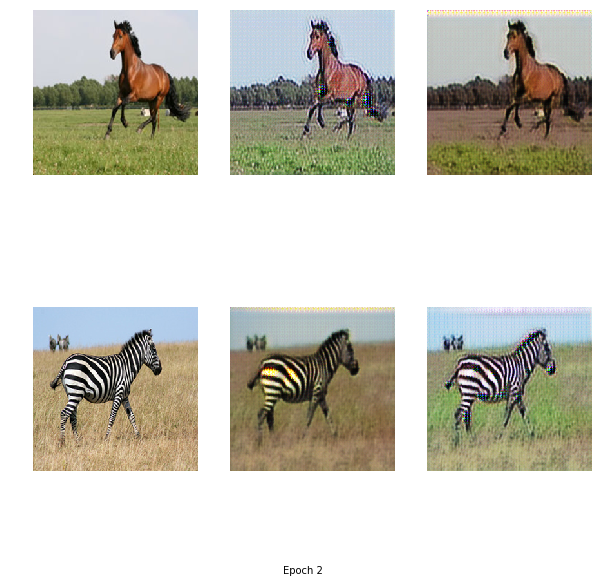

[Epoch 1/50] [Batch 366/1334] [D loss: 0.143195] [G loss: 3.635363, adv: 0.461779, cycle: 2.280512, identity: 0.893072] ETA: 7:03:26.432152

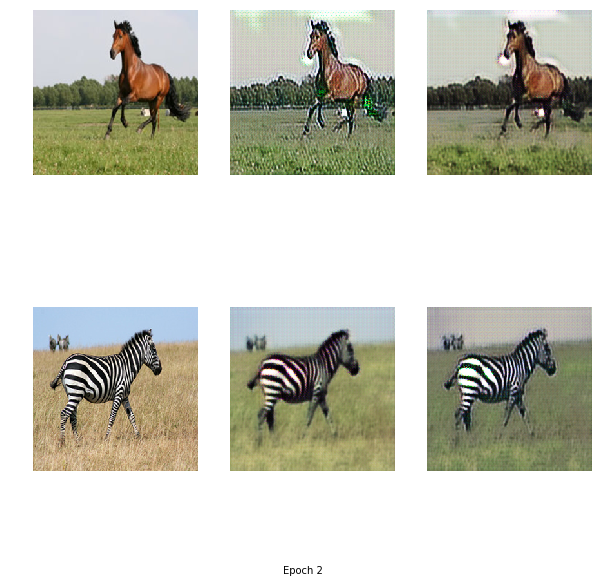

[Epoch 1/50] [Batch 466/1334] [D loss: 0.312558] [G loss: 3.893600, adv: 0.552799, cycle: 2.320387, identity: 1.020415] ETA: 7:02:18.549399

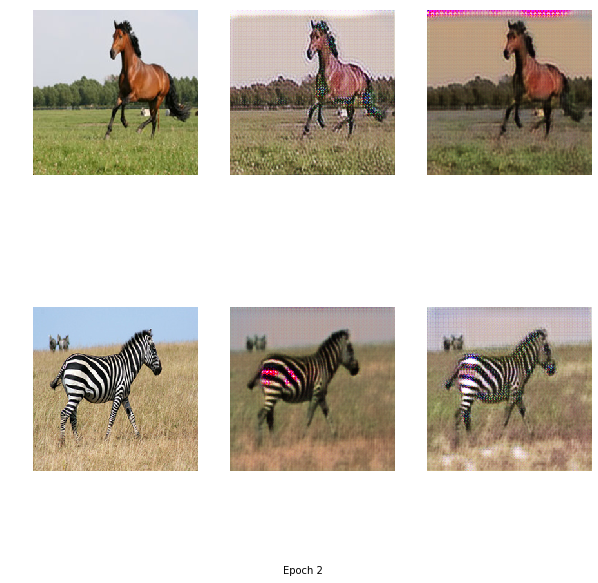

[Epoch 1/50] [Batch 566/1334] [D loss: 0.229391] [G loss: 3.469328, adv: 0.284411, cycle: 2.248304, identity: 0.936613] ETA: 7:02:02.943878

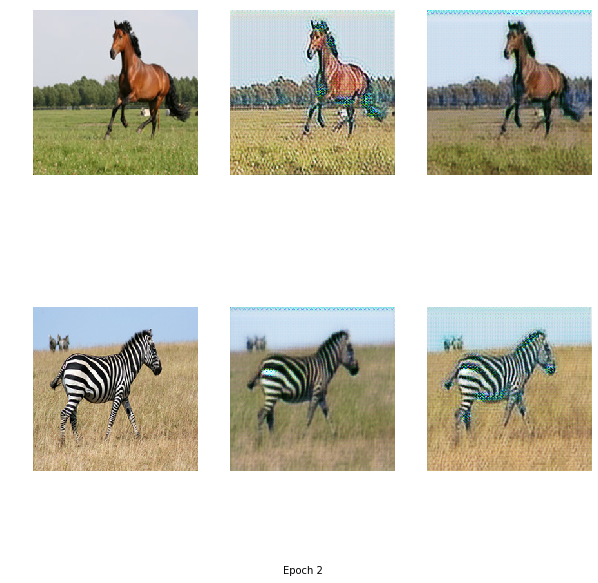

[Epoch 1/50] [Batch 666/1334] [D loss: 0.197860] [G loss: 3.064170, adv: 0.342180, cycle: 1.901706, identity: 0.820284] ETA: 7:00:57.086277

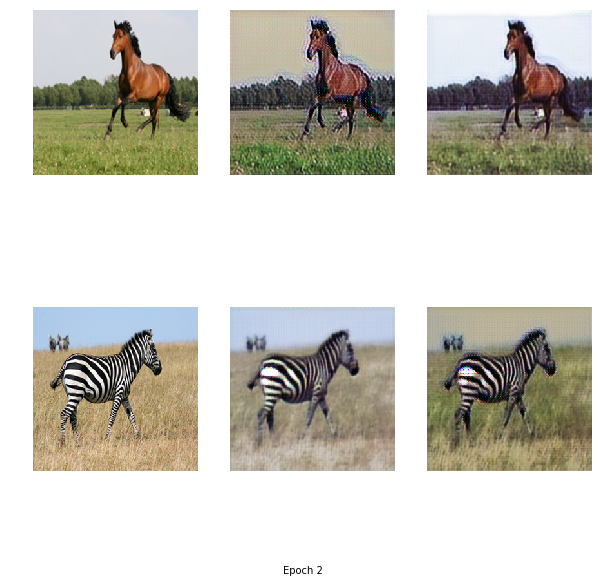

[Epoch 1/50] [Batch 766/1334] [D loss: 0.161091] [G loss: 3.360814, adv: 0.726264, cycle: 1.726423, identity: 0.908127] ETA: 7:00:14.398813

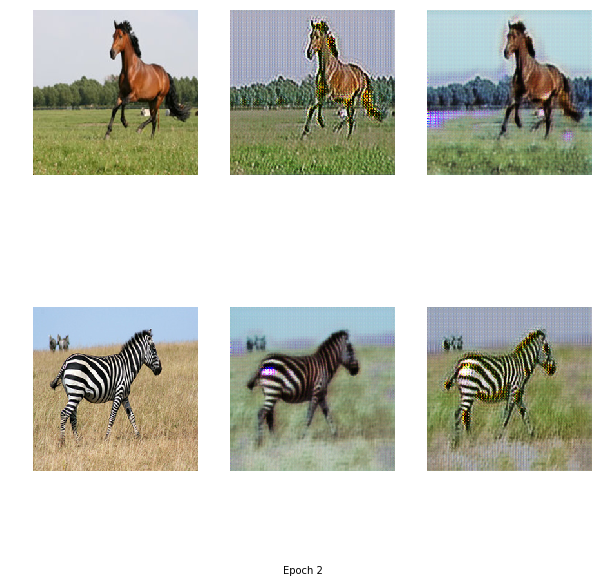

[Epoch 1/50] [Batch 866/1334] [D loss: 0.208878] [G loss: 3.737110, adv: 0.430922, cycle: 2.169226, identity: 1.136962] ETA: 6:59:10.639415

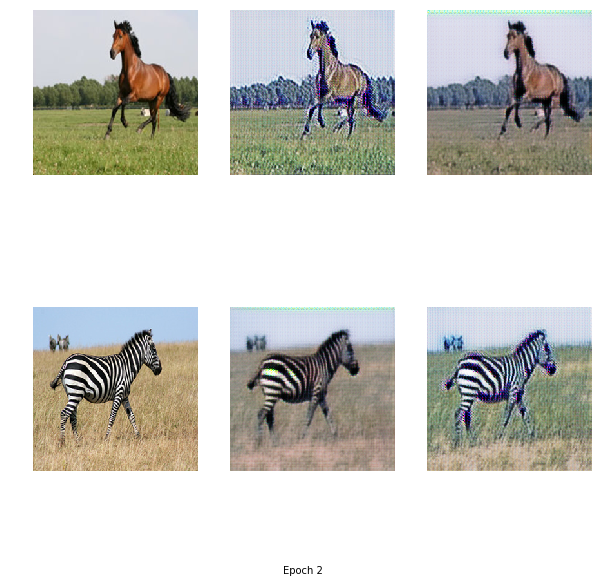

[Epoch 1/50] [Batch 966/1334] [D loss: 0.174992] [G loss: 3.489960, adv: 0.383698, cycle: 2.014847, identity: 1.091416] ETA: 6:59:19.597206

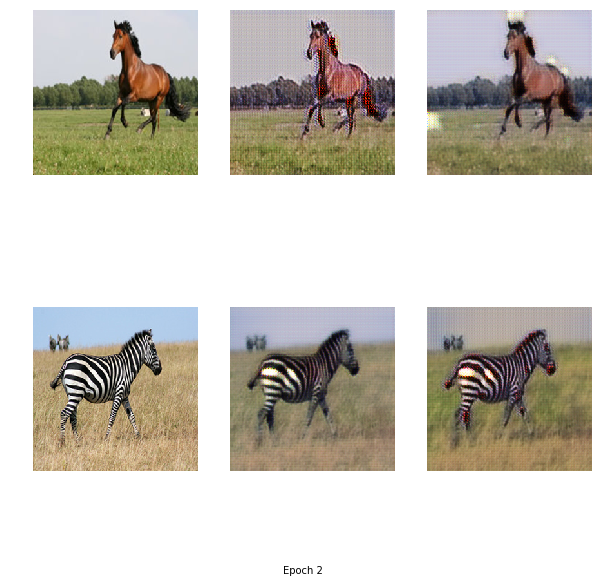

[Epoch 1/50] [Batch 1066/1334] [D loss: 0.227459] [G loss: 5.627358, adv: 0.374807, cycle: 3.582220, identity: 1.670332] ETA: 6:58:33.477564

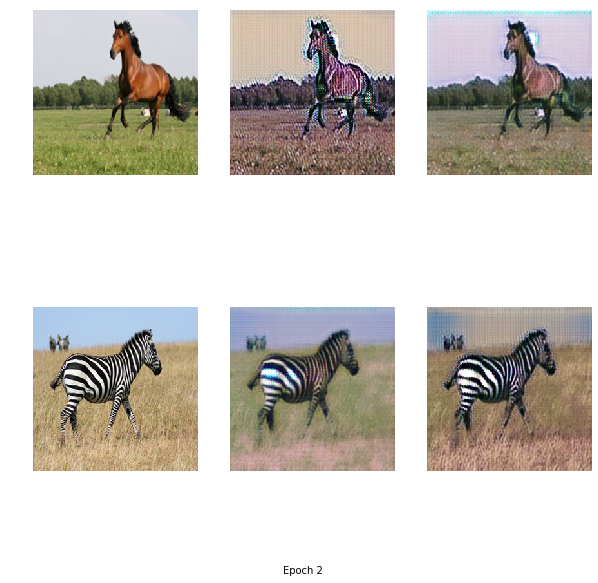

[Epoch 1/50] [Batch 1166/1334] [D loss: 0.510946] [G loss: 3.890601, adv: 0.762784, cycle: 2.055995, identity: 1.071822] ETA: 6:57:40.124588

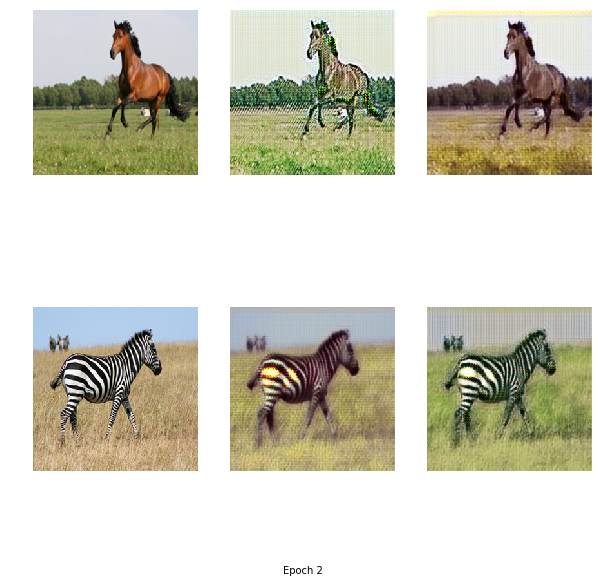

[Epoch 1/50] [Batch 1266/1334] [D loss: 0.125070] [G loss: 3.764576, adv: 0.275941, cycle: 2.499816, identity: 0.988819] ETA: 6:56:57.987752

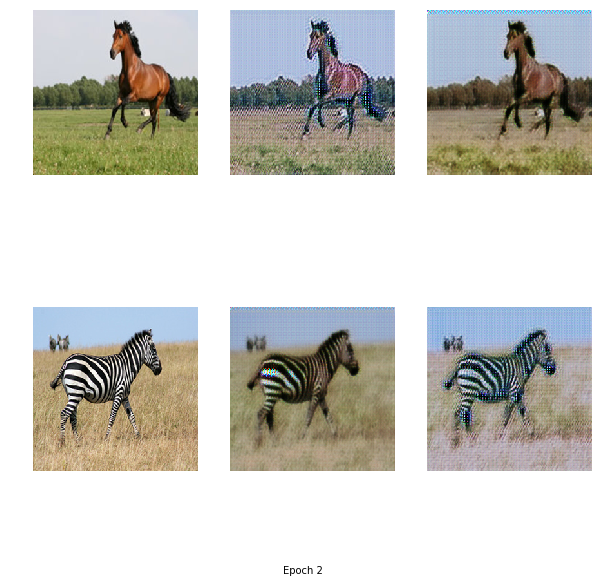

[Epoch 1/50] [Batch 1333/1334] [D loss: 0.328779] [G loss: 3.733531, adv: 0.190680, cycle: 2.333417, identity: 1.209434] ETA: 6:55:38.511473Time for one epoch is 529.5431334972382 sec
[Epoch 2/50] [Batch 32/1334] [D loss: 0.220246] [G loss: 3.470799, adv: 0.362024, cycle: 2.215009, identity: 0.893766] ETA: 7:01:56.741943

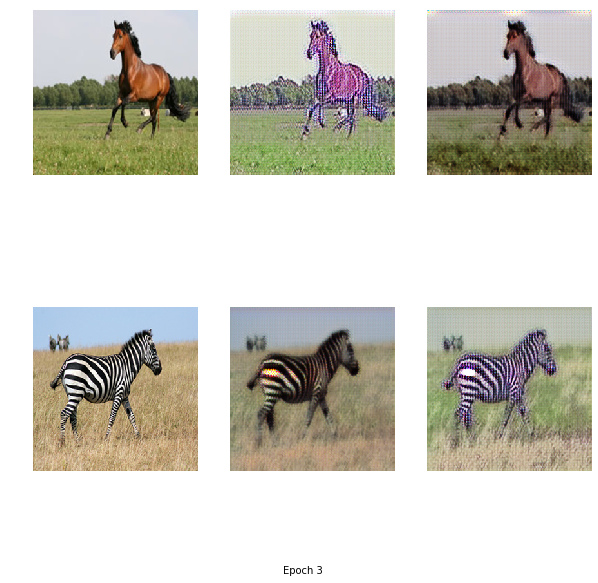

[Epoch 2/50] [Batch 132/1334] [D loss: 0.264893] [G loss: 2.835240, adv: 0.213476, cycle: 1.788022, identity: 0.833741] ETA: 6:55:46.662354

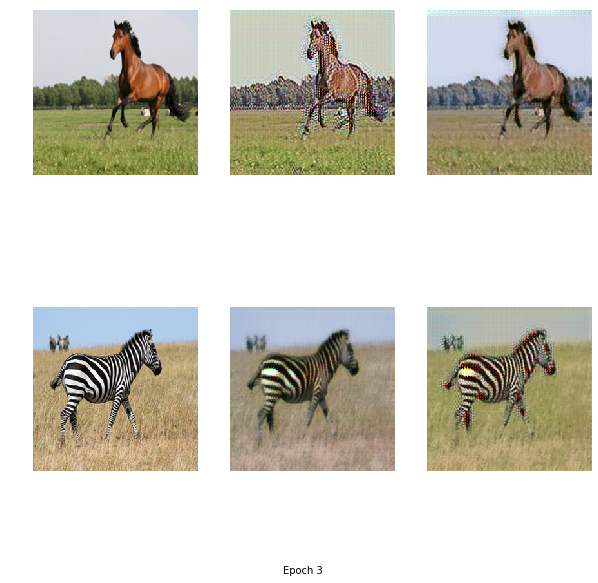

[Epoch 2/50] [Batch 227/1334] [D loss: 0.238914] [G loss: 3.118392, adv: 0.264964, cycle: 2.087047, identity: 0.766381] ETA: 6:55:46.570510

In [22]:
prev_time = time.time()
for epoch in range(50):
    start=time.time()
    for i, batch in enumerate(dataloader):

        # Set model input
        real_A = batch["A"].to(device)
        real_B = batch["B"].to(device)

        # ------------------
        #  Train Generators
        # ------------------

        G_AB.train()
        G_BA.train()

        optimizer_G.zero_grad()
        #A-->B
        fake_B=G_AB(real_A)
        D_B_fake_decision=D_B(fake_B)
        G_AB_loss=MSE_Loss(D_B_fake_decision,torch.full(D_B_fake_decision.size(),1,device=device))
        
        recon_A=G_BA(fake_B)
        cycle_A_loss=L1_Loss(recon_A,real_A)*10
        
        id_A=G_BA(real_A)
        id_A_loss=L1_Loss(id_A,real_A)*5
        #B-->A
        fake_A=G_BA(real_B)
        D_A_fake_decision=D_A(fake_A)
        G_BA_loss=MSE_Loss(D_A_fake_decision,torch.full(D_A_fake_decision.size(),1,device=device))
        
        recon_B=G_AB(fake_A)
        cycle_B_loss=L1_Loss(recon_B,real_B)*10
        
        id_B=G_AB(real_B)
        id_B_loss=L1_Loss(id_B,real_B)*5
        #update
        loss_cycle=(cycle_A_loss+cycle_B_loss)/2
        loss_gan=(G_AB_loss+G_BA_loss)/2
        loss_id=(id_A_loss+id_B_loss)/2
        loss_G=(G_AB_loss+G_BA_loss)/2+(cycle_A_loss+cycle_B_loss)/2+(id_A_loss+id_B_loss)/2
        
        loss_G.backward()
        optimizer_G.step()

        # -----------------------
        #  Train Discriminator A
        # -----------------------

        optimizer_D_A.zero_grad()

        D_A_real_decision=D_A(real_A)
        D_A_real_loss=MSE_Loss(D_A_real_decision,torch.full(D_A_real_decision.size(),1,device=device))
        
        fake_A = fake_A_pool.query(fake_A)
        
        D_A_fake_decision=D_A(fake_A.detach())
        D_A_fake_loss=MSE_Loss(D_A_fake_decision,torch.full(D_A_fake_decision.size(),0,device=device))
        #update
        D_A_loss=(D_A_real_loss+D_A_fake_loss)*0.5
        
        D_A_loss.backward()
        optimizer_D_A.step()

        # -----------------------
        #  Train Discriminator B
        # -----------------------

        optimizer_D_B.zero_grad()

        D_B_real_decision=D_B(real_B)
        D_B_real_loss=MSE_Loss(D_B_real_decision,torch.full(D_B_real_decision.size(),1,device=device))
        
        fake_B = fake_B_pool.query(fake_B)
        
        D_B_fake_decision=D_B(fake_B.detach())
        D_B_fake_loss=MSE_Loss(D_B_fake_decision,torch.full(D_B_fake_decision.size(),0,device=device))
        #update
        D_B_loss=(D_B_real_loss+D_B_fake_loss)*0.5

        D_B_loss.backward()
        optimizer_D_B.step()
        
        loss_D = (D_A_loss + D_B_loss) / 2

        # --------------
        #  Log Progress
        # --------------

        # Determine approximate time left
        batches_done = epoch * len(dataloader) + i
        batches_left = 50 * len(dataloader) - batches_done
        time_left = datetime.timedelta(seconds=batches_left * (time.time() - prev_time))
        prev_time = time.time()

        # Print log
        sys.stdout.write(
            "\r[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f, adv: %f, cycle: %f, identity: %f] ETA: %s"
            % (
                epoch,
                50,
                i,
                len(dataloader),
                loss_D.item(),
                loss_G.item(),
                loss_gan.item(),
                loss_cycle.item(),
                loss_id.item(),
                time_left,
            )
        )

        # If at sample interval save image
        if batches_done % 100 == 0:
            sample_images(batches_done)
    print('Time for one epoch is {} sec'.format(time.time()-start))
    # Update learning rates
    lr_scheduler_G.step()
    lr_scheduler_D_A.step()
    lr_scheduler_D_B.step()